In [1]:
# !pip install opencv-python scikit-learn pandas numpy matplotlib tensorflow-addons
# !pip install tensorflow==2.12 keras==2.12
# !pip install transformers datasets torchvision

In [1]:
import os
import kagglehub
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Conv2D, Multiply, GlobalAveragePooling2D, Dense, Input, Softmax, Add
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import kagglehub
from transformers import ViTImageProcessor, ViTForImageClassification
import torch
from datasets import load_dataset
from PIL import Image
import requests
from sklearn.metrics import classification_report
import torch
from torch.optim import AdamW 
from transformers import ViTFeatureExtractor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

2025-08-07 17:38:30.140310: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754588310.508699      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754588310.617174      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
path = kagglehub.dataset_download("adityamahimkar/iqothnccd-lung-cancer-dataset")
print("Path to dataset files:", path)
path = kagglehub.dataset_download("justinkirby/the-cancer-imaging-archive-lidcidri")
print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/iqothnccd-lung-cancer-dataset
Path to dataset files: /kaggle/input/the-cancer-imaging-archive-lidcidri


In [3]:
data_dir = '/kaggle/input/iqothnccd-lung-cancer-dataset/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset'
test_dir = '/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases'

Some weights of DeiTForImageClassificationWithTeacher were not initialized from the model checkpoint at facebook/deit-base-distilled-patch16-224 and are newly initialized because the shapes did not match:
- cls_classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([3, 768]) in the model instantiated
- cls_classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([3]) in the model instantiated
- distillation_classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([3, 768]) in the model instantiated
- distillation_classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([3]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Successfully loaded model weights from path.
Remapped classifier keys to fit the DeiT teacher model architecture.
Weights successfully loaded into DeiT model architecture.
--------------------------------------------------
Processing Category: Benign
--------------------------------------------------

Analyzing image: Bengin case (1).jpg
  True Class: 'Benign', Predicted Class: 'Malignant'


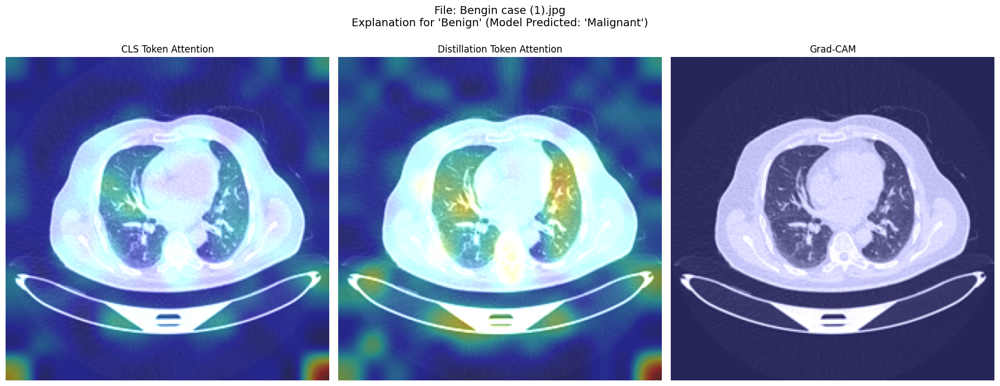


Analyzing image: Bengin case (10).jpg
  True Class: 'Benign', Predicted Class: 'Normal'


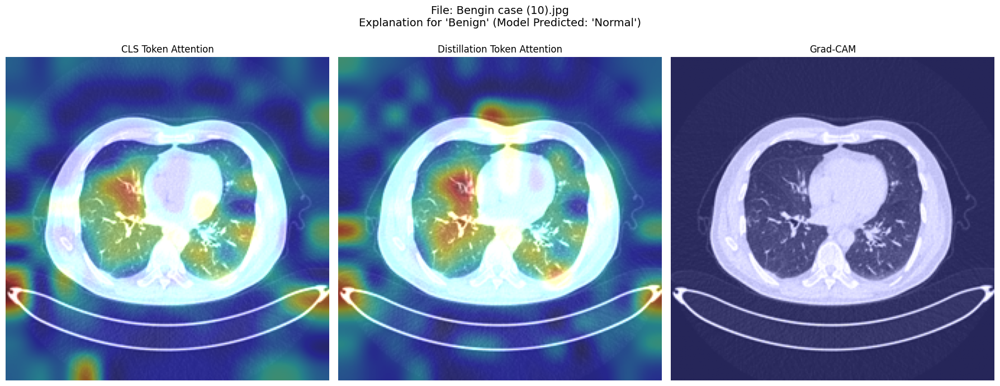


Analyzing image: Bengin case (100).jpg
  True Class: 'Benign', Predicted Class: 'Malignant'


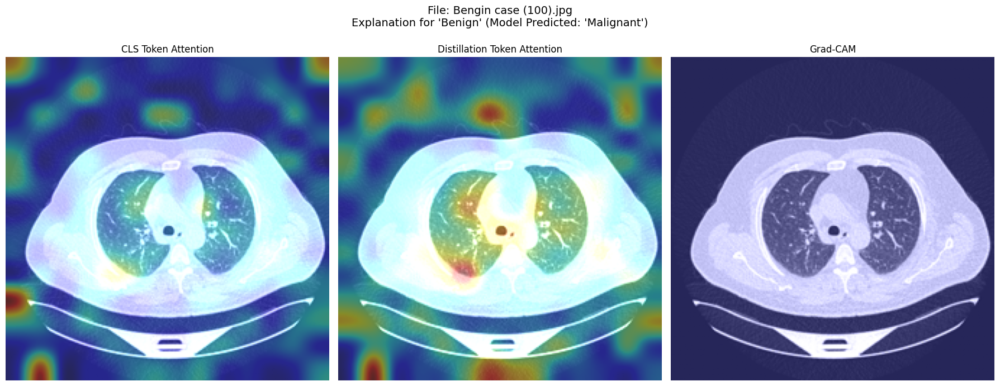

--------------------------------------------------
Processing Category: Malignant
--------------------------------------------------

Analyzing image: Malignant case (1).jpg
  True Class: 'Malignant', Predicted Class: 'Malignant'


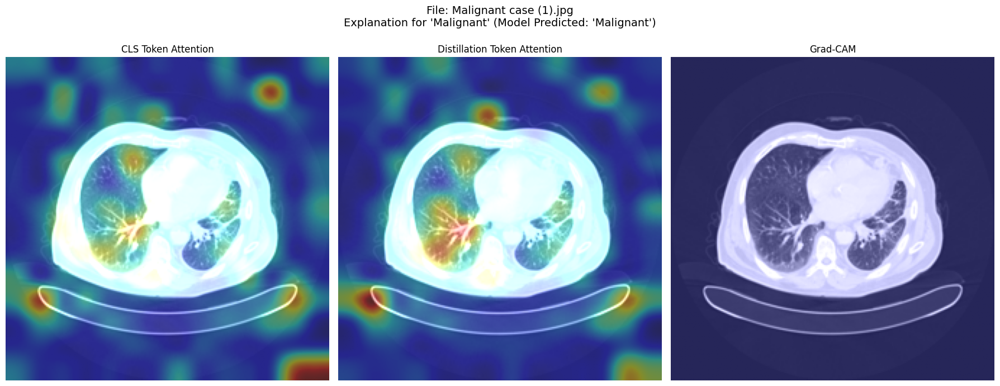


Analyzing image: Malignant case (10).jpg
  True Class: 'Malignant', Predicted Class: 'Normal'


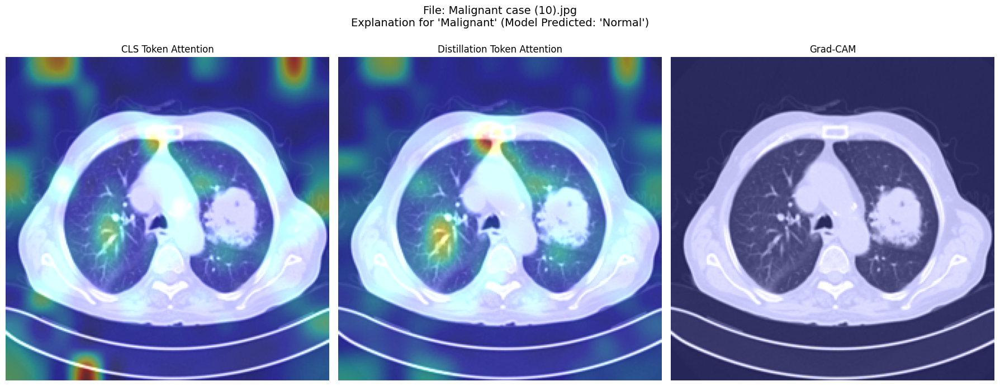


Analyzing image: Malignant case (100).jpg
  True Class: 'Malignant', Predicted Class: 'Malignant'


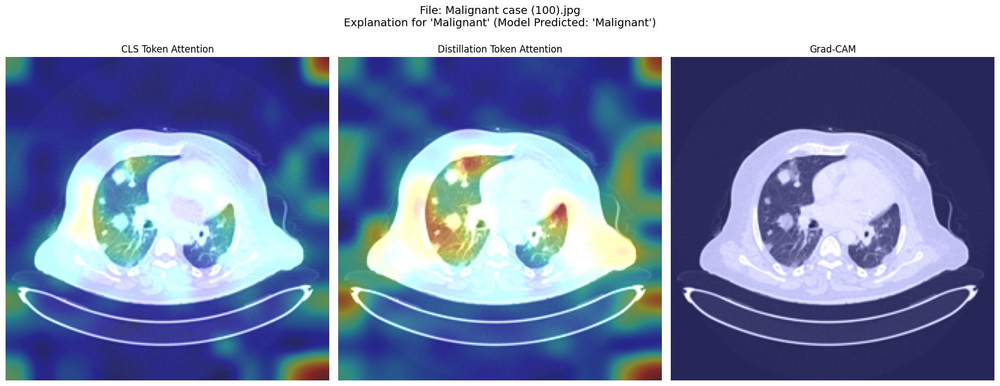

--------------------------------------------------
Processing Category: Normal
--------------------------------------------------

Analyzing image: Normal case (1).jpg
  True Class: 'Normal', Predicted Class: 'Normal'


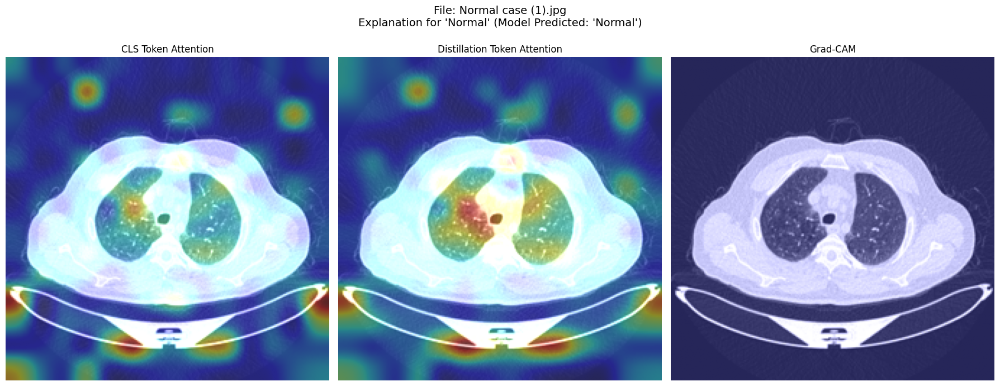


Analyzing image: Normal case (10).jpg
  True Class: 'Normal', Predicted Class: 'Normal'


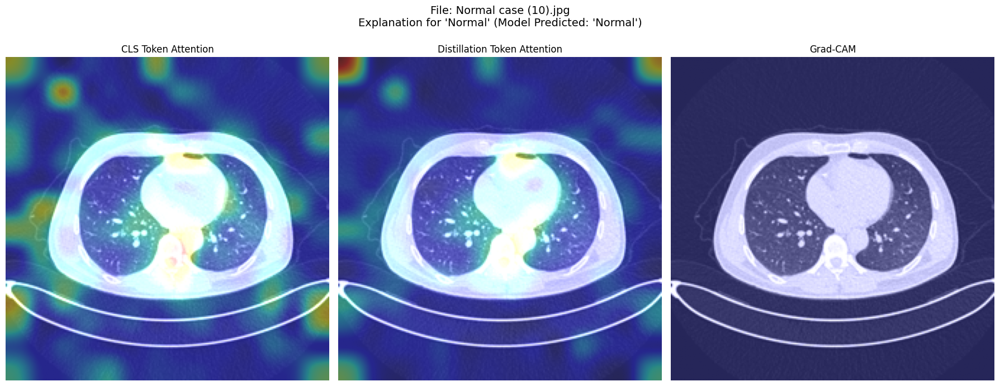


Analyzing image: Normal case (100).jpg
  True Class: 'Normal', Predicted Class: 'Normal'


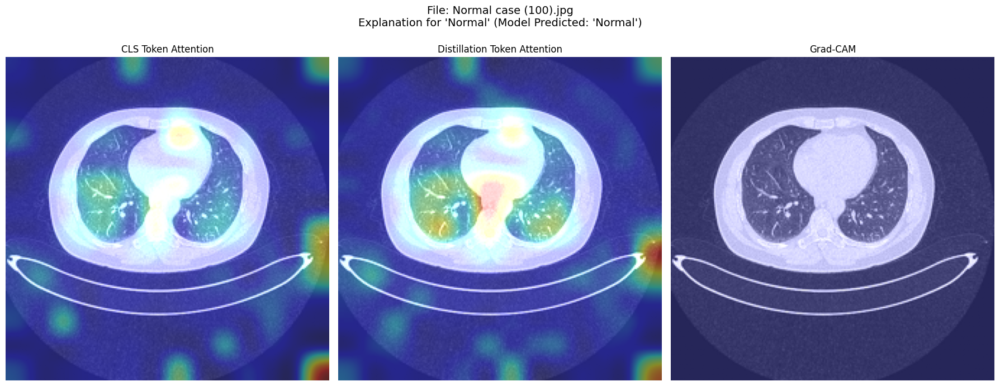

In [13]:
import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
import os
from transformers import DeiTForImageClassificationWithTeacher, DeiTImageProcessor

# --- Utility Functions (Unchanged) ---

def show_cam_on_image(img_np, cam_np):
    """Overlays a CAM heatmap onto an image."""
    heatmap = plt.cm.jet(cam_np)[..., :3]
    superimposed_img = heatmap * 0.4 + img_np
    superimposed_img = np.clip(superimposed_img, 0, 1)
    return superimposed_img

# --- Generic Grad-CAM for Transformer Models (Unchanged) ---

class TransformerGradCAM:
    """A generic Grad-CAM implementation for Vision Transformer-style models."""
    def __init__(self, model, target_block, num_special_tokens=2):
        self.model = model
        self.target_block = target_block
        self.num_special_tokens = num_special_tokens
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _capture_activations(self, module, input, output):
        # The output of the layer is a tuple. We need the first element.
        self.activations = output[0]

    def _capture_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def _register_hooks(self):
        self.h_activations = self.target_block.register_forward_hook(self._capture_activations)
        self.h_gradients = self.target_block.register_full_backward_hook(self._capture_gradients)

    def remove_hooks(self):
        self.h_activations.remove()
        self.h_gradients.remove()

    def __call__(self, input_tensor, target_class):
        self.model.zero_grad()
        output = self.model(**input_tensor)
        logits = output.logits
        logits[:, target_class].backward(retain_graph=True)
        
        activations = self.activations[:, self.num_special_tokens:, :]
        gradients = self.gradients[:, self.num_special_tokens:, :]
        
        alpha = gradients.mean(dim=-1, keepdim=True)
        cam = F.relu((alpha * activations).sum(dim=-1)).view(1, 14, 14)
        
        cam = F.interpolate(cam.unsqueeze(0), (224, 224), mode='bilinear', align_corners=False)
        cam = cam.squeeze().detach().cpu().numpy()
        
        if np.max(cam) == np.min(cam):
            return np.zeros_like(cam)
        
        cam = (cam - np.min(cam)) / (np.max(cam) - np.min(cam))
        return cam

# --- Analysis Function (Unchanged) ---

def generate_and_plot_heatmaps(model, processor, class_mapping, image_path, target_class_name, target_class_index):
    """Loads a single image and generates/plots the three heatmaps."""
    pil_img = Image.open(image_path).convert('RGB')
    display_img_np = np.array(pil_img.resize((224, 224))) / 255.0
    inputs = processor(images=pil_img, return_tensors="pt")

    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)
        
    predicted_class_index = outputs.logits.argmax(-1).item()
    predicted_class_name = class_mapping[predicted_class_index]
    print(f"  True Class: '{target_class_name}', Predicted Class: '{predicted_class_name}'")

    att_mat = outputs.attentions[-1]
    att_mat = torch.mean(att_mat, dim=1)
    
    cls_to_patch_att = att_mat[0, 0, 2:].reshape(14, 14).detach().cpu().numpy()
    cls_att_resized = np.array(Image.fromarray(cls_to_patch_att).resize((224, 224)))
    cls_att_normalized = (cls_att_resized - cls_att_resized.min()) / (cls_att_resized.max() - cls_att_resized.min())
    vis_cls_attention = show_cam_on_image(display_img_np, cls_att_normalized)
    
    distil_to_patch_att = att_mat[0, 1, 2:].reshape(14, 14).detach().cpu().numpy()
    distil_att_resized = np.array(Image.fromarray(distil_to_patch_att).resize((224, 224)))
    distil_att_normalized = (distil_att_resized - distil_att_resized.min()) / (distil_att_resized.max() - distil_att_resized.min())
    vis_distil_attention = show_cam_on_image(display_img_np, distil_att_normalized)

    grad_cam_generator = TransformerGradCAM(model, model.deit.encoder.layer[-1], num_special_tokens=2)
    grad_cam_heatmap = grad_cam_generator(inputs, target_class=target_class_index)
    grad_cam_generator.remove_hooks()
    vis_grad_cam = show_cam_on_image(display_img_np, grad_cam_heatmap)

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 7))
    fig.suptitle(f"File: {os.path.basename(image_path)}\nExplanation for '{target_class_name}' (Model Predicted: '{predicted_class_name}')", fontsize=14)
    
    ax1.imshow(vis_cls_attention)
    ax1.set_title("CLS Token Attention")
    ax1.axis('off')
    ax2.imshow(vis_distil_attention)
    ax2.set_title("Distillation Token Attention")
    ax2.axis('off')
    ax3.imshow(vis_grad_cam)
    ax3.set_title("Grad-CAM")
    ax3.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# --- Main Execution ---

if __name__ == '__main__':
    # --- 1. Setup Model and Load Fine-Tuned Weights ---
    MODEL_NAME = 'facebook/deit-base-distilled-patch16-224'
    
    # First, create the model architecture.
    # It's crucial that num_labels matches the model you saved.
    model = DeiTForImageClassificationWithTeacher.from_pretrained(
        MODEL_NAME,
        num_labels=3, 
        ignore_mismatched_sizes=True,
        attn_implementation="eager" 
    )
    
    # Define the path to your saved model weights
    model_path = "/kaggle/input/deit-fold-models/deit-fold-models/best_model_fold2.pth"
    
    # Load the state dictionary from the .pth file
    # map_location=torch.device('cpu') is important if you trained on a GPU and are now running on a CPU
    try:
        state_dict = torch.load(model_path, map_location=torch.device('cpu'))
        print("Successfully loaded model weights from path.")
    except FileNotFoundError:
        print(f"ERROR: Model file not found at {model_path}. Please check the path.")
        # Exit if the model file can't be found
        exit()

    # FIX: Remap the classifier keys from the saved file to match the model architecture.
    # The saved model has keys 'classifier.weight' and 'classifier.bias'.
    # The DeiTForImageClassificationWithTeacher model expects 'cls_classifier.*' and 'distillation_classifier.*'.
    if 'classifier.weight' in state_dict:
        # Copy the single classifier's weights to both the CLS and Distillation heads
        state_dict['cls_classifier.weight'] = state_dict['classifier.weight']
        state_dict['distillation_classifier.weight'] = state_dict['classifier.weight']
        # Do the same for the bias
        state_dict['cls_classifier.bias'] = state_dict['classifier.bias']
        state_dict['distillation_classifier.bias'] = state_dict['classifier.bias']
        # Remove the old, unexpected keys to prevent errors
        del state_dict['classifier.weight']
        del state_dict['classifier.bias']
        print("Remapped classifier keys to fit the DeiT teacher model architecture.")

    # Load the remapped weights into the model architecture
    model.load_state_dict(state_dict)
    print("Weights successfully loaded into DeiT model architecture.")
    
    # Set the model to evaluation mode
    model.eval()

    # Load the processor associated with the model
    processor = DeiTImageProcessor.from_pretrained(MODEL_NAME)

    # --- 2. Define Data Paths and Loop Through Images ---
    base_path = "/kaggle/input/iqothnccd-lung-cancer-dataset/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset"
    image_folders = {
        "Benign":    {"path": os.path.join(base_path, "Bengin cases"),    "class_index": 0},
        "Malignant": {"path": os.path.join(base_path, "Malignant cases"), "class_index": 1},
        "Normal":    {"path": os.path.join(base_path, "Normal cases"),    "class_index": 2}
    }
    
    class_mapping = {v['class_index']: k for k, v in image_folders.items()}
    IMAGES_PER_CATEGORY = 3

    for class_name, info in image_folders.items():
        folder_path = info["path"]
        class_index = info["class_index"]
        
        print("-" * 50)
        print(f"Processing Category: {class_name}")
        print("-" * 50)
        
        try:
            image_files = sorted([f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
            files_to_process = image_files[:IMAGES_PER_CATEGORY]

            if not files_to_process:
                print(f"  No images found in {folder_path}")
                continue

            for filename in files_to_process:
                print(f"\nAnalyzing image: {filename}")
                image_path = os.path.join(folder_path, filename)
                generate_and_plot_heatmaps(model, processor, class_mapping, image_path, class_name, class_index)
        
        except FileNotFoundError:
            print(f"  ERROR: Directory not found at {folder_path}")
        except Exception as e:
            print(f"  An unexpected error occurred: {e}")
